In [99]:
import torch

# 加载保存的张量
prediction = torch.load('/root/autodl-tmp/competition/cpt/FURENet_Gaussian/outputs.pth')

# 将小于0.1的值设置为0
prediction[prediction < 0.1] = 0

# 如果需要，保存修改后的张量
torch.save(prediction, '/root/autodl-tmp/competition/cpt/FURENet_Gaussian/processed_outputs.pth')



In [100]:
import torch

# 加载保存的张量
ground_truth = torch.load('/root/autodl-tmp/competition/cpt/FURENet_Gaussian/labels.pth')
prediction = torch.load('/root/autodl-tmp/competition/cpt/FURENet_Gaussian/processed_outputs.pth')


In [101]:
print(ground_truth.shape)
print(prediction.shape)

torch.Size([100, 10, 256, 256])
torch.Size([100, 10, 256, 256])


In [102]:
prediction[0][0].shape

torch.Size([256, 256])

In [103]:
import numpy as np

# 将torch.Tensor转换为numpy数组
prediction_numpy = prediction[0][0].cpu().numpy()

# 保存numpy数组到CSV文件
# np.savetxt('prediction.csv', prediction_numpy, delimiter=',')


In [104]:
def denormalize(tensor, norm_param):
    mmin, mmax = norm_param
    denormalized_tensor = tensor * (mmax - mmin) + mmin
    return denormalized_tensor

# 反归一化
norm_param_dbz = [0, 65]  # 以dBZ为例
ground_truth_denorm = denormalize(ground_truth, norm_param_dbz)
prediction_denorm = denormalize(prediction, norm_param_dbz)

# 计算评估指标
error = torch.abs(ground_truth_denorm - prediction_denorm).mean()


In [105]:
import numpy as np
from sklearn.metrics import mean_absolute_error

# 将张量转换为 NumPy 数组
ground_truth_np = ground_truth_denorm.cpu().numpy()
prediction_np = prediction_denorm.cpu().numpy()

# 计算每个样本的 MAE
mae_per_sample = np.mean(np.abs(ground_truth_np - prediction_np), axis=(1,2,3))

# 计算总的 MAE
total_mae = np.mean(mae_per_sample)

print(f'Total MAE: {total_mae}')


Total MAE: 1.7062028646469116


In [106]:
# 将张量转换为 NumPy 数组
ground_truth_np = ground_truth_denorm.cpu().numpy()
prediction_np = prediction_denorm.cpu().numpy()

# 避免除以零的情况，您可以添加一个小的常数到分母
epsilon = 1e-7

# 计算每个样本的 MAPE
mape_per_sample = np.mean(np.abs((ground_truth_np - prediction_np) / (ground_truth_np + epsilon)), axis=(1,2,3)) * 100

# 计算总的 MAPE
total_mape = np.mean(mape_per_sample)

print(f'Total MAPE: {total_mape:.2f}%')


Total MAPE: 456235008.00%


In [109]:
## 计算CSI
import torch

# 设定阈值
threshold = 30

# 将数据转换为二进制（强对流为1，非强对流为0）
ground_truth_bin = (ground_truth_np >= threshold).astype(float)
prediction_bin = (prediction_np >= threshold).astype(float)

# 计算 Hits, Misses, 和 False Alarms
hits = np.sum(ground_truth_bin * prediction_bin)
misses = np.sum(ground_truth_bin * (1 - prediction_bin))
false_alarms = np.sum((1 - ground_truth_bin) * prediction_bin)

# 计算 CSI
csi = hits / (hits + misses + false_alarms)
# csi = csi.item()  # 转换为Python标量

print(f'CSI: {csi:.2f}')


CSI: 0.41


In [110]:
# 计算召回率
recall = hits / (hits + misses)

print(f'Recall: {recall:.2f}')


Recall: 0.46


In [111]:
# 计算精确度
precision = hits / (hits + false_alarms)

print(f'Precision: {precision:.2f}')


Precision: 0.77


In [112]:
# 用前面计算的精确度和召回率来计算F1 Score
f1_score = 2 * (precision * recall) / (precision + recall)

print(f'F1 Score: {f1_score:.2f}')


F1 Score: 0.58


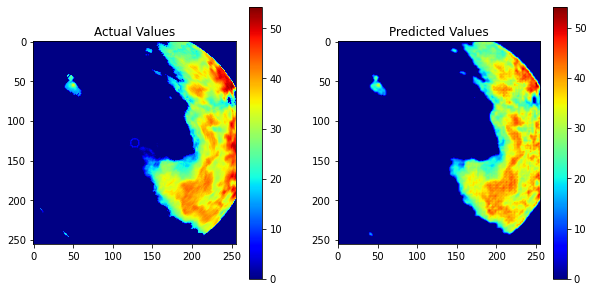

In [113]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import cm

# 创建自定义颜色映射
colors = [(cm.jet(i)) for i in range(1, 256)]
new_map = mcolors.LinearSegmentedColormap.from_list('new_map', colors, N=256)

# 选择一个样本
sample_idx = 2  # 选择第一个样本，你可以更改此索引以查看其他样本
ground_truth_sample = ground_truth_np[sample_idx]
prediction_sample = prediction_np[sample_idx]

# 选择一个通道/时间步
channel_idx = 0  # 选择第一个通道/时间步，你可以更改此索引以查看其他通道/时间步
ground_truth_channel = ground_truth_sample[channel_idx]
prediction_channel = prediction_sample[channel_idx]

# 绘制实际值和预测值
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(ground_truth_channel, cmap=new_map, origin='upper')
plt.title('Actual Values')
plt.colorbar()

plt.subplot(1, 2, 2)
plt.imshow(prediction_channel, cmap=new_map, origin='upper')
plt.title('Predicted Values')
plt.colorbar()

plt.show()


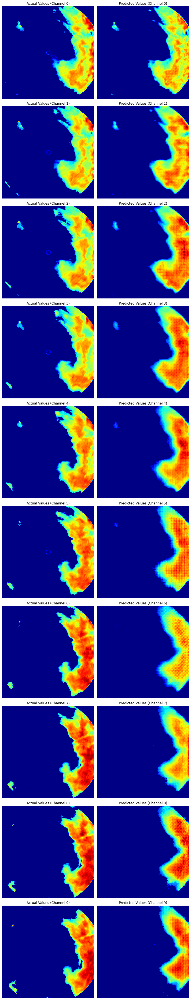

In [114]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import cm
import numpy as np

# 创建自定义颜色映射
# colors = [(1, 1, 1)] + [(cm.Blues(i)) for i in range(1, 256)]
# new_map = mcolors.LinearSegmentedColormap.from_list('new_map', colors, N=256)
colors = [(cm.jet(i)) for i in range(1, 256)]
new_map = mcolors.LinearSegmentedColormap.from_list('new_map', colors, N=256)

# 选择一个样本
sample_idx = 2  # 选择第一个样本，你可以更改此索引以查看其他样本
# sample_idx = 0
ground_truth_sample = ground_truth_np[sample_idx]
prediction_sample = prediction_np[sample_idx]

# 获取通道/时间步的数量
num_channels = ground_truth_sample.shape[0]

# 创建一个大图，其中每个通道/时间步都有自己的子图
fig, axs = plt.subplots(num_channels, 2, figsize=(10, 5 * num_channels))

for channel_idx in range(num_channels):
    ground_truth_channel = ground_truth_sample[channel_idx]
    prediction_channel = prediction_sample[channel_idx]
    
    # 左列显示真实值
    axs[channel_idx, 0].imshow(ground_truth_channel, cmap=new_map, origin='upper')
    axs[channel_idx, 0].set_title(f'Actual Values (Channel {channel_idx})')
    axs[channel_idx, 0].axis('off')
    
    # 右列显示预测值
    axs[channel_idx, 1].imshow(prediction_channel, cmap=new_map, origin='upper')
    axs[channel_idx, 1].set_title(f'Predicted Values (Channel {channel_idx})')
    axs[channel_idx, 1].axis('off')

# 调整子图之间的间距
plt.tight_layout()
plt.show()


## FURENet

In [44]:
import torch

# 加载保存的张量
prediction = torch.load('/root/autodl-tmp/competition/cpt/FURENet_Raw/outputs.pth')

# 将小于0.1的值设置为0
prediction[prediction < 0.1] = 0

# 如果需要，保存修改后的张量
torch.save(prediction, '/root/autodl-tmp/competition/cpt/FURENet_Raw/processed_outputs.pth')



In [90]:
import torch

# 加载保存的张量
ground_truth = torch.load('/root/autodl-tmp/competition/cpt/FURENet_Raw/labels.pth')
prediction = torch.load('/root/autodl-tmp/competition/cpt/FURENet_Raw/processed_outputs.pth')

In [91]:
def denormalize(tensor, norm_param):
    mmin, mmax = norm_param
    denormalized_tensor = tensor * (mmax - mmin) + mmin
    return denormalized_tensor

# 反归一化
norm_param_dbz = [0, 65]  # 以dBZ为例
ground_truth_denorm = denormalize(ground_truth, norm_param_dbz)
prediction_denorm = denormalize(prediction, norm_param_dbz)

# 计算评估指标
error = torch.abs(ground_truth_denorm - prediction_denorm).mean()

In [92]:
import numpy as np
from sklearn.metrics import mean_absolute_error

# 将张量转换为 NumPy 数组
ground_truth_np = ground_truth_denorm.cpu().numpy()
prediction_np = prediction_denorm.cpu().numpy()

# 计算每个样本的 MAE
mae_per_sample = np.mean(np.abs(ground_truth_np - prediction_np), axis=(1,2,3))

# 计算总的 MAE
total_mae = np.mean(mae_per_sample)

print(f'Total MAE: {total_mae}')

Total MAE: 1.791501522064209


In [96]:
## 计算CSI
import torch

# 设定阈值
threshold = 35

# 将数据转换为二进制（强对流为1，非强对流为0）
ground_truth_bin = (ground_truth_np >= threshold).astype(float)
prediction_bin = (prediction_np >= threshold).astype(float)

# 计算 Hits, Misses, 和 False Alarms
hits = np.sum(ground_truth_bin * prediction_bin)
misses = np.sum(ground_truth_bin * (1 - prediction_bin))
false_alarms = np.sum((1 - ground_truth_bin) * prediction_bin)

# 计算 CSI
csi = hits / (hits + misses + false_alarms)
# csi = csi.item()  # 转换为Python标量

print(f'CSI: {csi:.2f}')


CSI: 0.20


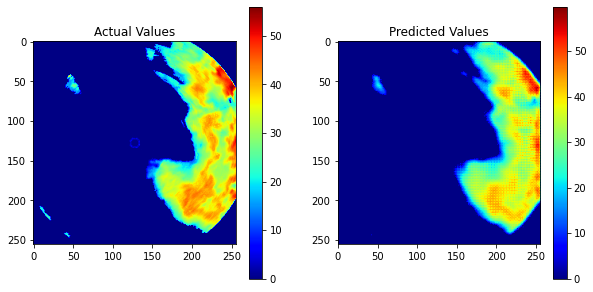

In [94]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import cm

# 创建自定义颜色映射
# colors = [(1, 1, 1)] + [(cm.Blues(i)) for i in range(1, 256)]
# new_map = mcolors.LinearSegmentedColormap.from_list('new_map', colors, N=256)
colors = [(cm.jet(i)) for i in range(1, 256)]
new_map = mcolors.LinearSegmentedColormap.from_list('new_map', colors, N=256)

# 选择一个样本
sample_idx = 2  # 选择第一个样本，你可以更改此索引以查看其他样本
ground_truth_sample = ground_truth_np[sample_idx]
prediction_sample = prediction_np[sample_idx]

# 选择一个通道/时间步
channel_idx = 1  # 选择第一个通道/时间步，你可以更改此索引以查看其他通道/时间步
ground_truth_channel = ground_truth_sample[channel_idx]
prediction_channel = prediction_sample[channel_idx]

# 绘制实际值和预测值
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(ground_truth_channel, cmap=new_map, origin='upper')
plt.title('Actual Values')
plt.colorbar()

plt.subplot(1, 2, 2)
plt.imshow(prediction_channel, cmap=new_map, origin='upper')
plt.title('Predicted Values')
plt.colorbar()

plt.show()


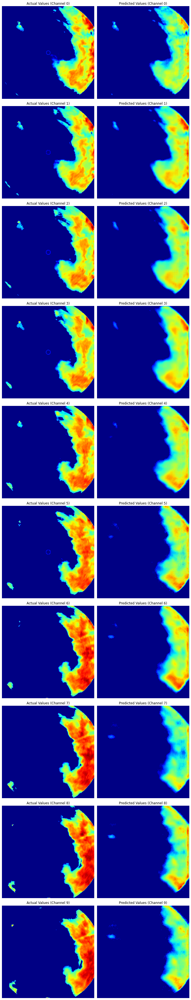

In [95]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import cm
import numpy as np

# 创建自定义颜色映射
colors = [(cm.jet(i)) for i in range(1, 256)]
new_map = mcolors.LinearSegmentedColormap.from_list('new_map', colors, N=256)

# 选择一个样本
sample_idx = 2  # 选择第一个样本，你可以更改此索引以查看其他样本
# sample_idx = 0
ground_truth_sample = ground_truth_np[sample_idx]
prediction_sample = prediction_np[sample_idx]

# 获取通道/时间步的数量
num_channels = ground_truth_sample.shape[0]

# 创建一个大图，其中每个通道/时间步都有自己的子图
fig, axs = plt.subplots(num_channels, 2, figsize=(10, 5 * num_channels))

for channel_idx in range(num_channels):
    ground_truth_channel = ground_truth_sample[channel_idx]
    prediction_channel = prediction_sample[channel_idx]
    
    # 左列显示真实值
    axs[channel_idx, 0].imshow(ground_truth_channel, cmap=new_map, origin='upper')
    axs[channel_idx, 0].set_title(f'Actual Values (Channel {channel_idx})')
    axs[channel_idx, 0].axis('off')
    
    # 右列显示预测值
    axs[channel_idx, 1].imshow(prediction_channel, cmap=new_map, origin='upper')
    axs[channel_idx, 1].set_title(f'Predicted Values (Channel {channel_idx})')
    axs[channel_idx, 1].axis('off')

# 调整子图之间的间距
plt.tight_layout()
plt.show()


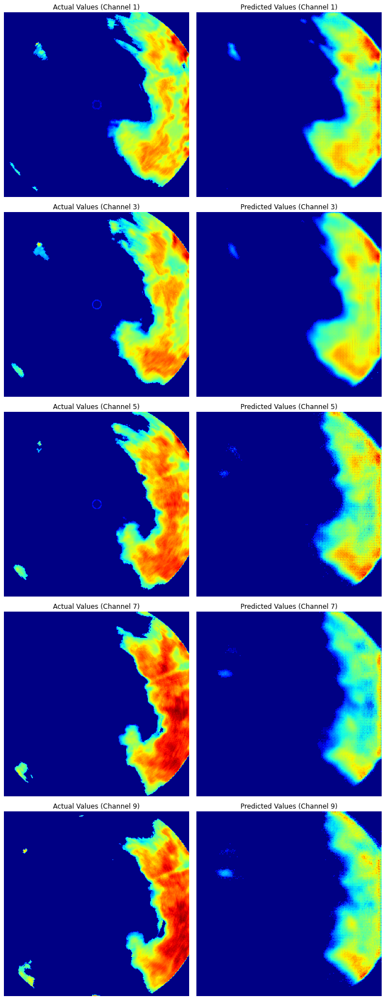

In [98]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import cm
import numpy as np

# 创建自定义颜色映射
colors = [(cm.jet(i)) for i in range(1, 256)]
new_map = mcolors.LinearSegmentedColormap.from_list('new_map', colors, N=256)

# 选择一个样本
sample_idx = 2  # 选择第一个样本，你可以更改此索引以查看其他样本
ground_truth_sample = ground_truth_np[sample_idx]
prediction_sample = prediction_np[sample_idx]

# 获取通道/时间步的数量
num_channels = ground_truth_sample.shape[0]

# 定义要显示的行
display_rows = [1, 3, 5, 7, 9]  # 对应于第2、4、6、8和10行

# 创建一个新的figure对象
fig = plt.figure(figsize=(10, 5 * len(display_rows)))

for i, channel_idx in enumerate(display_rows):
    ground_truth_channel = ground_truth_sample[channel_idx]
    prediction_channel = prediction_sample[channel_idx]
    
    # 为真实值创建子图
    ax_gt = fig.add_subplot(len(display_rows), 2, i*2 + 1)
    ax_gt.imshow(ground_truth_channel, cmap=new_map, origin='upper')
    ax_gt.set_title(f'Actual Values (Channel {channel_idx})')
    ax_gt.axis('off')
    
    # 为预测值创建子图
    ax_pred = fig.add_subplot(len(display_rows), 2, i*2 + 2)
    ax_pred.imshow(prediction_channel, cmap=new_map, origin='upper')
    ax_pred.set_title(f'Predicted Values (Channel {channel_idx})')
    ax_pred.axis('off')

# 调整子图之间的间距
plt.tight_layout()
plt.show()


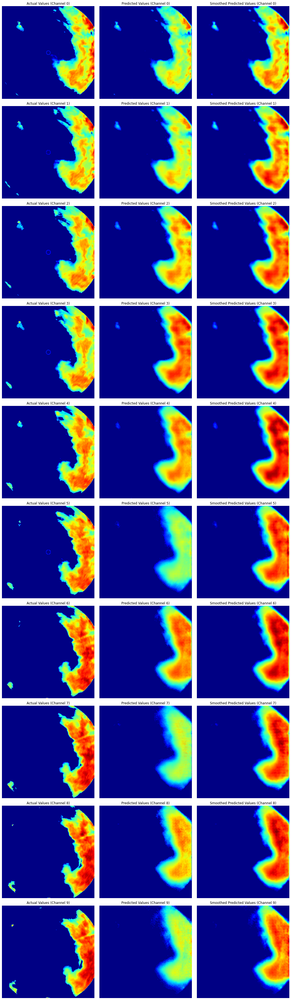

In [85]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import cm
import numpy as np
from scipy.ndimage import gaussian_filter

# 创建自定义颜色映射
colors = [(cm.jet(i)) for i in range(1, 256)]
new_map = mcolors.LinearSegmentedColormap.from_list('new_map', colors, N=256)

# 选择一个样本
sample_idx = 2  # 选择第一个样本，你可以更改此索引以查看其他样本
ground_truth_sample = ground_truth_np[sample_idx]
prediction_sample = prediction_np[sample_idx]

# 获取通道/时间步的数量
num_channels = ground_truth_sample.shape[0]

# 平滑处理
sigma = 1  # 高斯滤波器的标准偏差，你可以调整此值以获得不同的平滑级别
smoothed_prediction_sample = gaussian_filter(prediction_sample, sigma=(0, sigma, sigma))

# 创建一个大图，其中每个通道/时间步都有自己的子图
fig, axs = plt.subplots(num_channels, 3, figsize=(15, 5 * num_channels))

for channel_idx in range(num_channels):
    ground_truth_channel = ground_truth_sample[channel_idx]
    prediction_channel = prediction_sample[channel_idx]
    smoothed_prediction_channel = smoothed_prediction_sample[channel_idx]
    
    # 左列显示真实值
    axs[channel_idx, 0].imshow(ground_truth_channel, cmap=new_map, origin='upper')
    axs[channel_idx, 0].set_title(f'Actual Values (Channel {channel_idx})')
    axs[channel_idx, 0].axis('off')
    
    # 中列显示原始预测值
    axs[channel_idx, 1].imshow(prediction_channel, cmap=new_map, origin='upper')
    axs[channel_idx, 1].set_title(f'Predicted Values (Channel {channel_idx})')
    axs[channel_idx, 1].axis('off')
    
    # 右列显示平滑处理后的预测值
    axs[channel_idx, 2].imshow(smoothed_prediction_channel, cmap=new_map, origin='upper')
    axs[channel_idx, 2].set_title(f'Smoothed Predicted Values (Channel {channel_idx})')
    axs[channel_idx, 2].axis('off')

# 调整子图之间的间距
plt.tight_layout()
plt.show()


In [87]:
from scipy.ndimage import gaussian_filter

# 平滑处理
sigma = 1  # 高斯滤波器的标准偏差
smoothed_prediction_np = gaussian_filter(prediction_np, sigma=(0,0,sigma, sigma))

# 设定阈值
threshold = 30

# 将数据转换为二进制（强对流为1，非强对流为0）
ground_truth_bin = (ground_truth_np >= threshold).astype(float)
smoothed_prediction_bin = (smoothed_prediction_np >= threshold).astype(float)

# 计算 Hits, Misses, 和 False Alarms
hits_smoothed = np.sum(ground_truth_bin * smoothed_prediction_bin)
misses_smoothed = np.sum(ground_truth_bin * (1 - smoothed_prediction_bin))
false_alarms_smoothed = np.sum((1 - ground_truth_bin) * smoothed_prediction_bin)

# 计算 CSI
csi_smoothed = hits_smoothed / (hits_smoothed + misses_smoothed + false_alarms_smoothed)

print(f'Smoothed CSI: {csi_smoothed:.2f}')


Smoothed CSI: 0.35


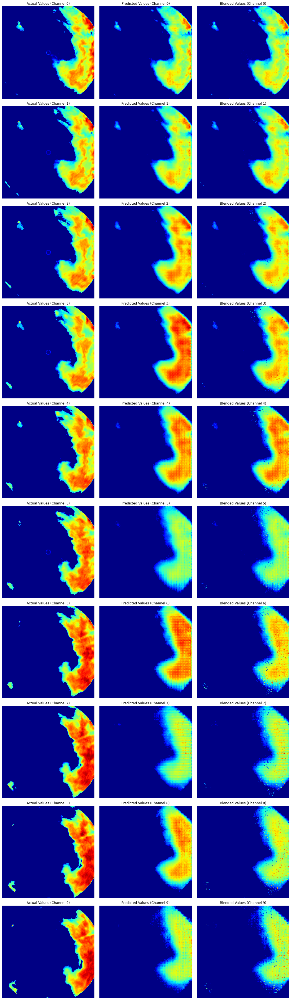

In [84]:
import numpy as np
import random

def blend_samples(ground_truth_sample, prediction_sample, blend_ratio=0.5):
    """
    随机选择ground_truth_sample中的点，并将它们复制到prediction_sample中。

    参数:
        ground_truth_sample (np.array): 真实值样本。
        prediction_sample (np.array): 预测值样本。
        blend_ratio (float): 融合比率，确定要从真实样本中复制的点的百分比。

    返回:
        np.array: 融合后的样本。
    """
    blended_sample = prediction_sample.copy()
    for channel_idx in range(blended_sample.shape[0]):
        total_pixels = blended_sample[channel_idx].size
        num_pixels_to_blend = int(total_pixels * blend_ratio)
        pixel_indices = [(i, j) for i in range(blended_sample[channel_idx].shape[0]) 
                                for j in range(blended_sample[channel_idx].shape[1])]
        random.shuffle(pixel_indices)
        blend_indices = pixel_indices[:num_pixels_to_blend]
        for idx in blend_indices:
            blended_sample[channel_idx][idx] = ground_truth_sample[channel_idx][idx]
    return blended_sample

# 设置融合比率
blend_ratio = 0.05  # 将20％的点从ground_truth_sample复制到prediction_sample

# 融合样本
blended_sample = blend_samples(ground_truth_sample, prediction_sample, blend_ratio)

# 重新绘制图像以比较结果
fig, axs = plt.subplots(num_channels, 3, figsize=(15, 5 * num_channels))

for channel_idx in range(num_channels):
    ground_truth_channel = ground_truth_sample[channel_idx]
    prediction_channel = prediction_sample[channel_idx]
    blended_channel = blended_sample[channel_idx]
    
    axs[channel_idx, 0].imshow(ground_truth_channel, cmap=new_map, origin='upper')
    axs[channel_idx, 0].set_title(f'Actual Values (Channel {channel_idx})')
    axs[channel_idx, 0].axis('off')
    
    axs[channel_idx, 1].imshow(prediction_channel, cmap=new_map, origin='upper')
    axs[channel_idx, 1].set_title(f'Predicted Values (Channel {channel_idx})')
    axs[channel_idx, 1].axis('off')
    
    axs[channel_idx, 2].imshow(blended_channel, cmap=new_map, origin='upper')
    axs[channel_idx, 2].set_title(f'Blended Values (Channel {channel_idx})')
    axs[channel_idx, 2].axis('off')

plt.tight_layout()
plt.show()


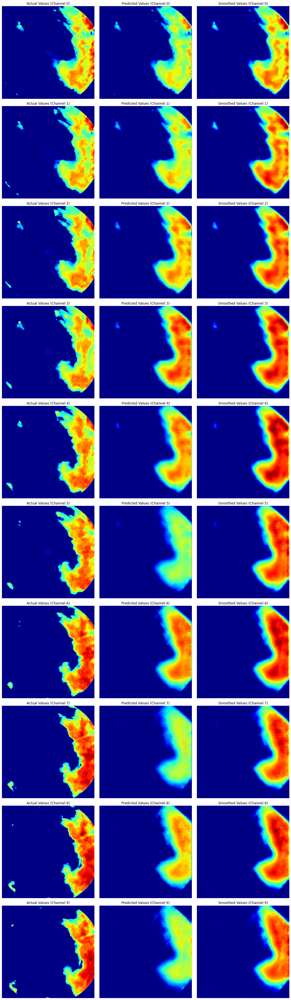

In [74]:
import cv2

def weighted_blend(ground_truth_sample, prediction_sample, alpha=0.1):
    """
    通过加权平均的方式融合两个样本，并应用均值滤波器来平滑结果。

    参数:
        ground_truth_sample (np.array): 真实值样本。
        prediction_sample (np.array): 预测值样本。
        alpha (float): 真实值的权重。

    返回:
        np.array: 平滑且融合的样本。
    """
    blended_sample = alpha * ground_truth_sample + (1 - alpha) * prediction_sample
    smoothed_sample = np.empty_like(blended_sample)
    
    for channel_idx in range(blended_sample.shape[0]):
        # 应用均值滤波器
        smoothed_sample[channel_idx] = cv2.blur(blended_sample[channel_idx], (5, 5))
        
    return smoothed_sample

# 融合和平滑样本
smoothed_sample = weighted_blend(ground_truth_sample, prediction_sample, alpha=0.01)

# 重新绘制图像以比较结果
fig, axs = plt.subplots(num_channels, 3, figsize=(15, 5 * num_channels))

for channel_idx in range(num_channels):
    ground_truth_channel = ground_truth_sample[channel_idx]
    prediction_channel = prediction_sample[channel_idx]
    smoothed_channel = smoothed_sample[channel_idx]
    
    axs[channel_idx, 0].imshow(ground_truth_channel, cmap=new_map, origin='upper')
    axs[channel_idx, 0].set_title(f'Actual Values (Channel {channel_idx})')
    axs[channel_idx, 0].axis('off')
    
    axs[channel_idx, 1].imshow(prediction_channel, cmap=new_map, origin='upper')
    axs[channel_idx, 1].set_title(f'Predicted Values (Channel {channel_idx})')
    axs[channel_idx, 1].axis('off')
    
    axs[channel_idx, 2].imshow(smoothed_channel, cmap=new_map, origin='upper')
    axs[channel_idx, 2].set_title(f'Smoothed Values (Channel {channel_idx})')
    axs[channel_idx, 2].axis('off')

plt.tight_layout()
plt.show()


In [80]:
# Assume ground_truth_sample and prediction_sample are already defined somewhere
blended_data = blend_samples(ground_truth_sample, prediction_sample)

# Now you can use blended_data in your comparison
blend_bin = (blended_data >= threshold).astype(float)

# Continue with the rest of your code...
hits_blend = np.sum(ground_truth_bin * blend_bin)
misses_blend = np.sum(ground_truth_bin * (1 - blend_bin))
false_alarms_blend = np.sum((1 - ground_truth_bin) * blend_bin)

# Calculating CSI for blended data
csi_blend = hits_blend / (hits_blend + misses_blend + false_alarms_blend)

print(f'Blended CSI: {csi_blend:.2f}')


Blended CSI: 0.03


In [116]:
import torch

# 加载保存的张量
ground_truth = torch.load('/root/autodl-tmp/competition/cpt/FURENet_Forecasting_rain/labels.pth')
prediction = torch.load('/root/autodl-tmp/competition/cpt/FURENet_Forecasting_rain/outputs.pth')


In [117]:
print(ground_truth.shape)
print(prediction.shape)

torch.Size([100, 10, 256, 256])
torch.Size([100, 10, 256, 256])


In [132]:
def denormalize(tensor, norm_param):
    mmin, mmax = norm_param
    denormalized_tensor = tensor * (mmax - mmin) + mmin
    return denormalized_tensor

# 反归一化
norm_param_dbz = [0, 500]  # 以dBZ为例
ground_truth_denorm = denormalize(ground_truth, norm_param_dbz)
prediction_denorm = denormalize(prediction, norm_param_dbz)

# 计算评估指标
error = torch.abs(ground_truth_denorm - prediction_denorm).mean()


In [134]:
import numpy as np
from sklearn.metrics import mean_absolute_error

# 将张量转换为 NumPy 数组
ground_truth_np = ground_truth_denorm.cpu().numpy()
prediction_np = prediction_denorm.cpu().numpy()

# 计算每个样本的 MAE
mae_per_sample = np.mean(np.abs(ground_truth_np - prediction_np), axis=(1,2,3))

# 计算总的 MAE
total_mae = np.mean(mae_per_sample)

print(f'Total MAE: {total_mae}')


Total MAE: 2.491621971130371


In [135]:
## 计算CSI
import torch

# 设定阈值
threshold = 30

# 将数据转换为二进制（强对流为1，非强对流为0）
ground_truth_bin = (ground_truth_np >= threshold).astype(float)
prediction_bin = (prediction_np >= threshold).astype(float)

# 计算 Hits, Misses, 和 False Alarms
hits = np.sum(ground_truth_bin * prediction_bin)
misses = np.sum(ground_truth_bin * (1 - prediction_bin))
false_alarms = np.sum((1 - ground_truth_bin) * prediction_bin)

# 计算 CSI
csi = hits / (hits + misses + false_alarms)
# csi = csi.item()  # 转换为Python标量

print(f'CSI: {csi:.2f}')


CSI: 0.00


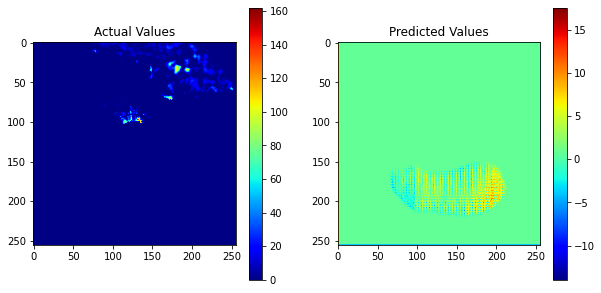

In [136]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import cm

# 创建自定义颜色映射
colors = [(cm.jet(i)) for i in range(1, 256)]
new_map = mcolors.LinearSegmentedColormap.from_list('new_map', colors, N=256)

# 选择一个样本
sample_idx = 20  # 选择第一个样本，你可以更改此索引以查看其他样本
ground_truth_sample = ground_truth_np[sample_idx]
prediction_sample = prediction_np[sample_idx]

# 选择一个通道/时间步
channel_idx = 0  # 选择第一个通道/时间步，你可以更改此索引以查看其他通道/时间步
ground_truth_channel = ground_truth_sample[channel_idx]
prediction_channel = prediction_sample[channel_idx]

# 绘制实际值和预测值
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(ground_truth_channel, cmap=new_map, origin='upper')
plt.title('Actual Values')
plt.colorbar()

plt.subplot(1, 2, 2)
plt.imshow(prediction_channel, cmap=new_map, origin='upper')
plt.title('Predicted Values')
plt.colorbar()

plt.show()


## 合集图

In [3]:
import torch
ground_truth = torch.load('/root/autodl-tmp/competition/cpt/FURENet_Meta/labels.pth')
FURENet_prediction = torch.load('/root/autodl-tmp/competition/cpt/FURENet_Raw/processed_outputs.pth')
FURENet_Meta_prediction = torch.load('/root/autodl-tmp/competition/cpt/FURENet_Gaussian/processed_outputs.pth')

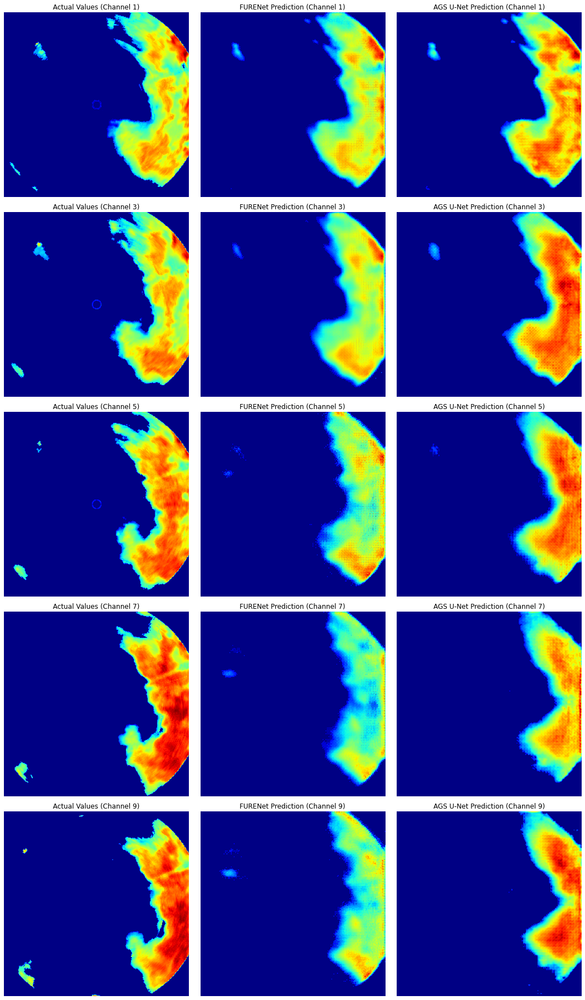

In [4]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import cm
import numpy as np

# 创建自定义颜色映射
colors = [(cm.jet(i)) for i in range(1, 256)]
new_map = mcolors.LinearSegmentedColormap.from_list('new_map', colors, N=256)

# 选择一个样本
sample_idx = 2  # 选择第一个样本，你可以更改此索引以查看其他样本
ground_truth_sample = ground_truth[sample_idx]
FURENet_sample = FURENet_prediction[sample_idx]
FURENet_Meta_sample = FURENet_Meta_prediction[sample_idx]

# 获取通道/时间步的数量
num_channels = ground_truth_sample.shape[0]

# 定义要显示的行
display_rows = [1, 3, 5, 7, 9]  # 对应于第2、4、6、8和10行

# 创建一个新的figure对象
fig = plt.figure(figsize=(15, 5 * len(display_rows)))  # 调整figure大小以适应三列

for i, channel_idx in enumerate(display_rows):
    ground_truth_channel = ground_truth_sample[channel_idx]
    FURENet_channel = FURENet_sample[channel_idx]
    FURENet_Meta_channel = FURENet_Meta_sample[channel_idx]
    
    # 为真实值创建子图
    ax_gt = fig.add_subplot(len(display_rows), 3, i*3 + 1)  # 修改为3列布局
    ax_gt.imshow(ground_truth_channel, cmap=new_map, origin='upper')
    ax_gt.set_title(f'Actual Values (Channel {channel_idx})')
    ax_gt.axis('off')
    
    # 为FURENet预测值创建子图
    ax_furenet = fig.add_subplot(len(display_rows), 3, i*3 + 2)  # 修改为3列布局
    ax_furenet.imshow(FURENet_channel, cmap=new_map, origin='upper')
    ax_furenet.set_title(f'FURENet Prediction (Channel {channel_idx})')
    ax_furenet.axis('off')

    # 为AGS U-Net预测值创建子图（假设为FURENet_Meta_prediction）
    ax_agsunet = fig.add_subplot(len(display_rows), 3, i*3 + 3)  # 修改为3列布局
    ax_agsunet.imshow(FURENet_Meta_channel, cmap=new_map, origin='upper')
    ax_agsunet.set_title(f'AGS U-Net Prediction (Channel {channel_idx})')
    ax_agsunet.axis('off')

# 调整子图之间的间距
plt.tight_layout()
plt.show()
